In [1]:
import numpy as np
import cv2
import os

from sklearn.metrics import precision_recall_curve, average_precision_score
from inspect import signature

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sb
sb.set_style('darkgrid')

from tqdm import tqdm_notebook as tqdm

import sys
sys.path.append('../')
from utils import get_frames
from utils import show_single_frame as show_image

### Define all functions we need

In [2]:
def opencv_histogram(img):
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    return hist

def custom_histogram(img):
    hist = np.bincount(img.ravel(), minlength=256)
    return hist

def l2_distance(vec1, vec2):
    return ((vec1 - vec2) ** 2).sum()

def compute_features(imgs, feature_extractor):
    features = []
    for img in tqdm(imgs):
        feature = feature_extractor(img).reshape(-1)
        features.append(feature)
    return features

def similarity_search(query, features, imgs, feature_extractor):
        
    # compute query feature
    query_feature = feature_extractor(query).reshape(-1)
    
    # perform similarity search
    distances = []
    for feature in tqdm(features):
        distance = l2_distance(query_feature, feature)
        distances.append(distance)
    
    # get top-10 images
    imgs = np.array(imgs)
    top_10_ids = np.argsort(distances)[:10]
    top_10_images = imgs[top_10_ids]
    
    return top_10_images

def pr_curve(true_labels, predicted_labels, ax):
    precision, recall, _ = precision_recall_curve(true_labels, predicted_labels)
    average_precision = average_precision_score(true_labels, predicted_labels)

    step_kwargs = ({'step': 'post'}
                   if 'step' in signature(plt.fill_between).parameters
                   else {})
    ax.step(recall, precision, color='b', alpha=0.2,
             where='post')
    ax.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

    ax.set_xlabel('Recall')
    ax.set_ylabel('Precision')
    ax.set_ylim([0.0, 1.05])
    ax.set_xlim([0.0, 1.0])
    ax.set_title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
              average_precision))

### Load images

**Get all images**

In [3]:
frames, gray_frames = get_frames('../data/image_retrieval/img/')

**Show random image**

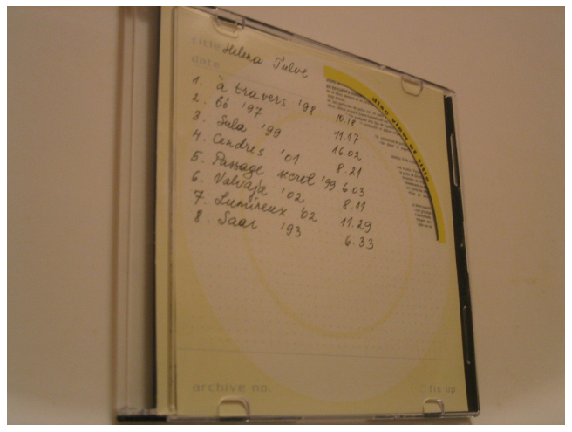

In [4]:
random_id = np.random.randint(0, len(frames))
random_frame = frames[random_id]
random_gray_frame = gray_frames[random_id]
show_image(random_frame)

**Let's look on it's histogram**

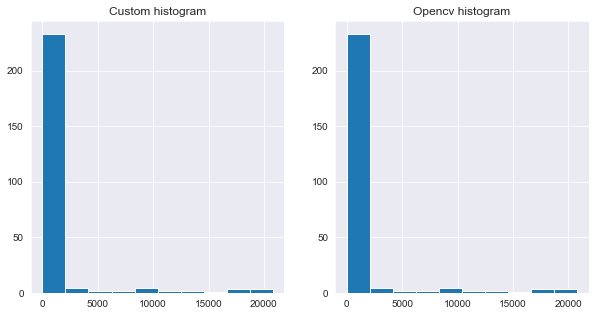

In [5]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# custom histogram via numpy
custom_hist = custom_histogram(random_gray_frame)
_ = ax[0].set_title('Custom histogram')
_ = ax[0].hist(custom_hist)
# opencv histogram
opencv_hist = opencv_histogram(random_gray_frame)
_ = ax[1].set_title('Opencv histogram')
_ = ax[1].hist(opencv_hist)


### Now let's build simple retrieval system

**Let's look at queries**

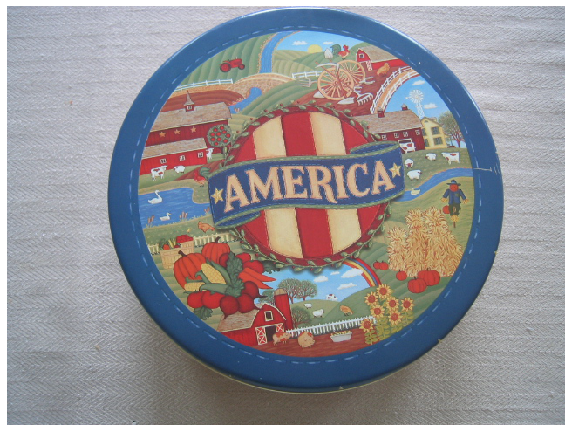

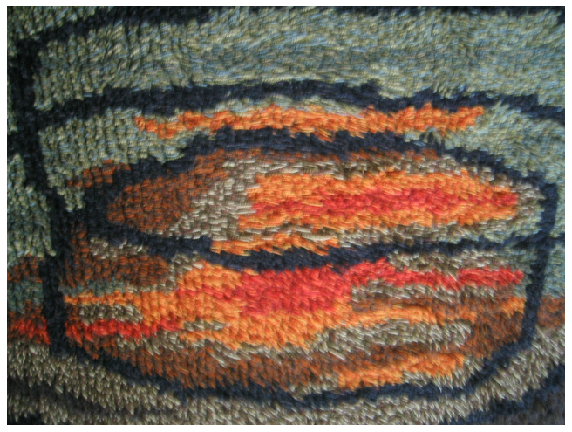

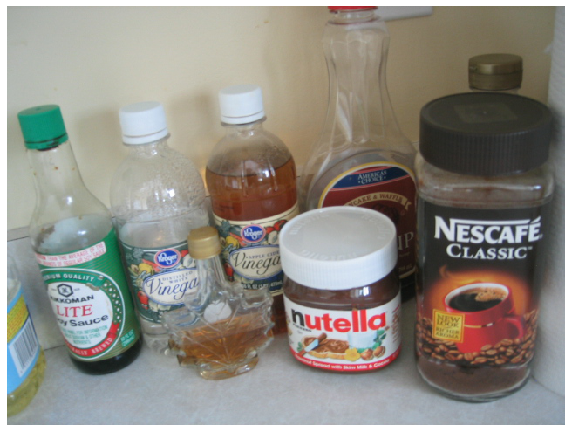

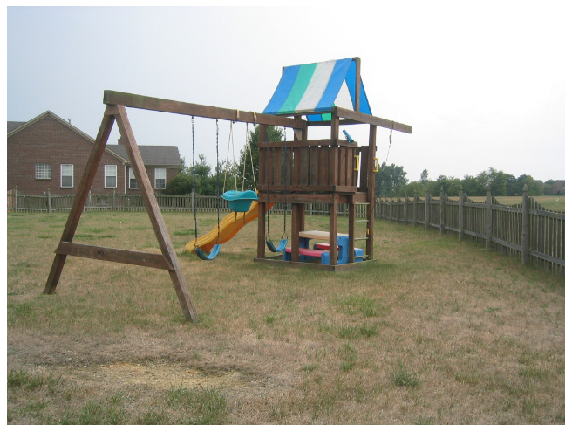

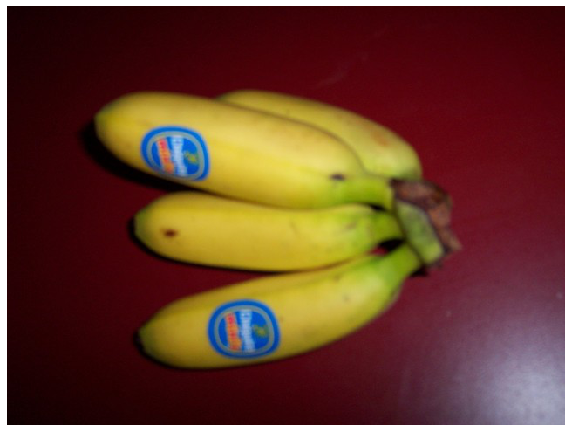

In [6]:
queries = ['ukbench00004.jpg', 'ukbench00040.jpg', 'ukbench00060.jpg', 'ukbench00588.jpg', 'ukbench01562.jpg']
query_imgs = []
for query in queries:
    path = os.path.join('../data/image_retrieval/img/' + query)
    query_img = cv2.imread(path)
    query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB)
    query_imgs.append(query_img)
    show_image(query_img)
    

**Now we'll compute features fow all images database**

In [7]:
features = compute_features(gray_frames, feature_extractor=custom_histogram)

**Let's find best matches queries**

In [8]:
results = []
for query_img in query_imgs:
    result = similarity_search(cv2.cvtColor(query_img, cv2.COLOR_RGB2GRAY), features, frames, feature_extractor=custom_histogram)
    results.append(result)

**Let's have a look on the results**

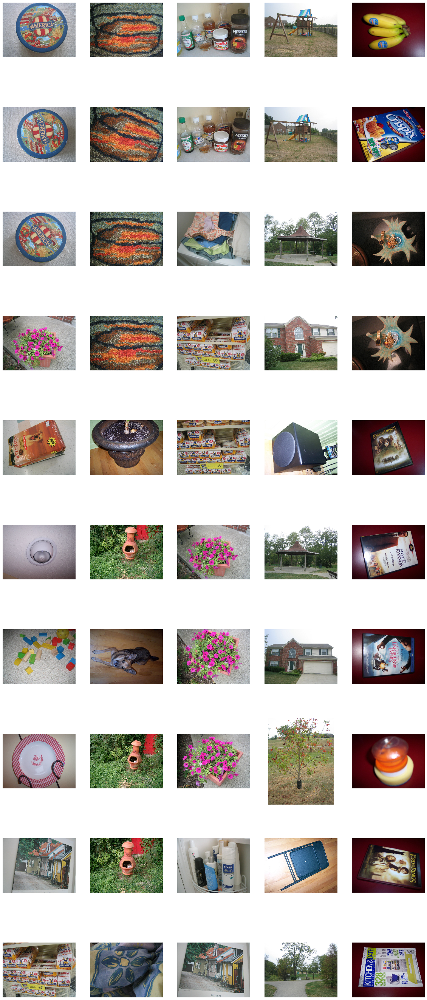

In [9]:
fig, ax = plt.subplots(10, 5, figsize=(20, 50))

for j in range(0, 5):
    for i, result in enumerate(results[j]):        
        _ = ax[i][j].imshow(result)
        _ = ax[i][j].axis('off')
        _ = ax[i][j].grid(False)


### PR Curve

**Define true labels**

In [10]:
true_labels = np.array([[1, 1, 1, 1, 0, 0, 0, 0, 0, 0]]*5)

**Define predicted labels based on result above**

In [11]:
predicted_labels = np.array([[1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
                             [1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
                             [1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
                             [1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
                             [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

**Plot PR curves for each query**

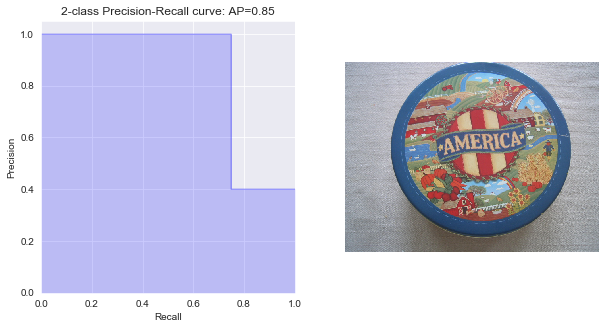

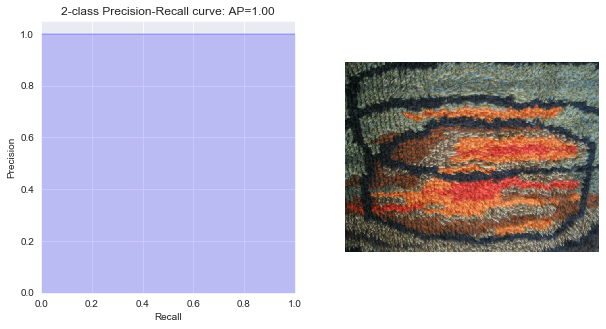

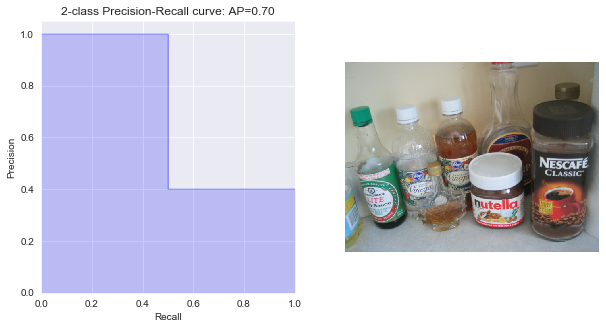

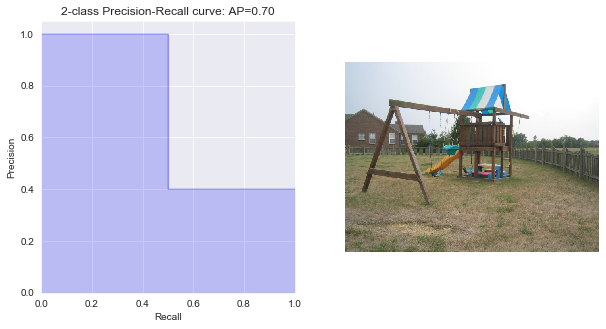

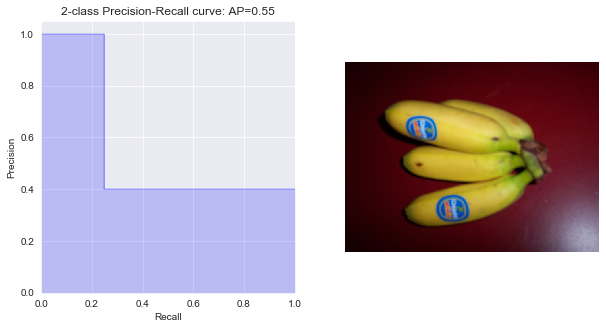

In [12]:
for true, predicted, query in zip(true_labels, predicted_labels, query_imgs):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[1].imshow(query)
    ax[1].axis('off')
    ax[1].grid('False')
    pr_curve(true, predicted, ax=ax[0])

### Discussion

It's easy to see that similarity search with histograms as feature extractor is capable of finding query image itself and one or two neighbours, but only if variation in brightness or color between query and its neighbours isn't too large. For example, first (can with "America" sign) and second (carpet) queries have a little variation between between neighbours and they were recognized correctly in most cases. Except one heavily overbrighten image with "America" sign, which wasn't recognized as similar. It's a good example, which shows where histograms fail.  

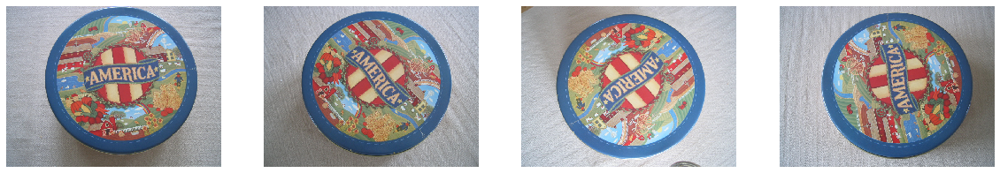

In [13]:
examples = ['ukbench00004.jpg', 'ukbench00005.jpg', 'ukbench00006.jpg', 'ukbench00007.jpg']
fig, ax = plt.subplots(1, 4, figsize=(20, 10))
for i, example in enumerate(examples):
    path = os.path.join('../data/image_retrieval/img/' + example)
    example_img = cv2.imread(path)
    example_img = cv2.cvtColor(example_img, cv2.COLOR_BGR2RGB)
    ax[i].imshow(example_img)
    ax[i].axis('off')
    ax[i].grid(False)

Those problems can be solved by using 3d histograms, which will take color into consideration or some more advanced features like SIFT descriptor. But even they don't capture semantic information and if we need it, we should go for feature extractors based on CNN's.

### Let's try different feature extractors

**Color histogram**

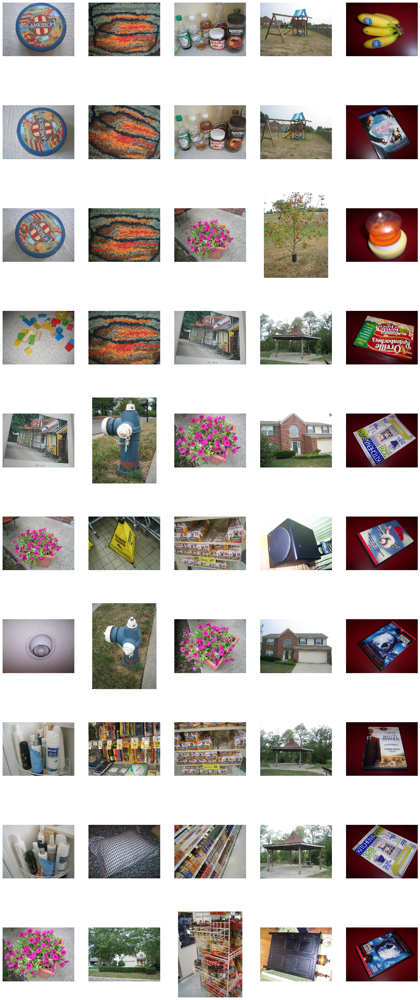

In [14]:
# define feature extractor function
def color_histogram(img):
    hist_r = cv2.calcHist([img], [0], None, [256], [0, 256]).reshape(-1)
    hist_g = cv2.calcHist([img], [1], None, [256], [0, 256]).reshape(-1)
    hist_b = cv2.calcHist([img], [2], None, [256], [0, 256]).reshape(-1)
    return np.concatenate([hist_r, hist_g, hist_b]).flatten()

    
# compute results
features = compute_features(frames, feature_extractor=color_histogram)
results = []
for query_img in query_imgs:
    result = similarity_search(query_img, features, frames, feature_extractor=color_histogram)
    results.append(result)

# show results
fig, ax = plt.subplots(10, 5, figsize=(20, 50))
for j in range(0, 5):
    for i, result in enumerate(results[j]):        
        _ = ax[i][j].imshow(result)
        _ = ax[i][j].axis('off')
        _ = ax[i][j].grid(False)
